In [3]:
# # Bharat Petroleum Corporation Ltd.,ENERGY,BPCL,EQ,INE029A01011: The dataset used is stock market data of the 
# Nifty-50 index from NSE (National Stock Exchange) India over the last 20 years (2000 - 2019) The historic VWAP 
# (Volume Weighted Average Price) is the target variable to predict. VWAP is a trading benchmark used by traders 
# that gives the average price the stock has traded at throughout the day, based on both volume and price.

In [1]:
import pandas as pd
stock_market_data = pd.read_csv('Capstone3_Data/BPCL.csv')

In [2]:
# Looking for missing values
missing = pd.concat([stock_market_data.isnull().sum(), 100 * stock_market_data.isnull().mean()],axis = 1)
missing.columns=['count', '%']
missing = missing.sort_values(by='count')
missing

,count,%
Date,0,0.000000
Symbol,0,0.000000
Series,0,0.000000
Prev Close,0,0.000000
Open,0,0.000000
High,0,0.000000
Low,0,0.000000
Last,0,0.000000
Close,0,0.000000
VWAP,0,0.000000


In [3]:
stock_market_data.select_dtypes('object')

,Date,Symbol,Series
0,2000-01-03,BPCL,EQ
1,2000-01-04,BPCL,EQ
2,2000-01-05,BPCL,EQ
3,2000-01-06,BPCL,EQ
4,2000-01-07,BPCL,EQ
...,...,...,...
5301,2021-04-26,BPCL,EQ
5302,2021-04-27,BPCL,EQ
5303,2021-04-28,BPCL,EQ
5304,2021-04-29,BPCL,EQ


In [4]:
stock_market_data.tail().transpose()

,5301,5302,5303,5304,5305
Date,2021-04-26,2021-04-27,2021-04-28,2021-04-29,2021-04-30
Symbol,BPCL,BPCL,BPCL,BPCL,BPCL
Series,EQ,EQ,EQ,EQ,EQ
Prev Close,423.05,418.9,420.35,417.5,419.55
Open,426,417.5,422,422,417.5
High,428.35,423.1,424.35,423,437.5
Low,417.55,416.55,414.9,417,414.65
Last,417.6,420,417.15,419,422.1
Close,418.9,420.35,417.5,419.55,421.8
VWAP,421.33,420.45,419.33,420,428.14


In [5]:
from pandas_profiling import ProfileReport
print(stock_market_data.dtypes)

Date                   object
Symbol                 object
Series                 object
Prev Close            float64
Open                  float64
High                  float64
Low                   float64
Last                  float64
Close                 float64
VWAP                  float64
Volume                  int64
Turnover              float64
Trades                float64
Deliverable Volume    float64
%Deliverble           float64
dtype: object


In [6]:
df = pd.DataFrame(stock_market_data)

In [7]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)
profile.to_widgets()
profile.to_notebook_iframe()

In [9]:
from datetime import datetime
# creates a function that takes an input and converts it to specific datetime format
def fixTime(daily):
     return datetime.strptime(daily, '%Y-%m-%d')#Y-m-d 
    
stock_market_data['Time'] = stock_market_data.Date.map(fixTime)

In [11]:
print(stock_market_data['Time'].dtypes)
data1 = stock_market_data.drop(['Date'], axis = 1)
data2 = data1.drop(['Series'], axis = 1)
data3 = data2.drop(['Symbol'], axis = 1)
data4 = data3.drop(['Trades'], axis = 1) #Trades has 53% missing values so we'll drop it.
stock_market = pd.DataFrame(data4)

datetime64[ns]


In [12]:
print(stock_market.dtypes)

Prev Close                   float64
Open                         float64
High                         float64
Low                          float64
Last                         float64
Close                        float64
VWAP                         float64
Volume                         int64
Turnover                     float64
Deliverable Volume           float64
%Deliverble                  float64
Time                  datetime64[ns]
dtype: object


In [13]:
stock_market.describe()

,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Deliverable Volume,%Deliverble
count,5306.000000,5306.000000,5306.000000,5306.000000,5306.000000,5306.000000,5306.000000,5.306000e+03,5.306000e+03,4.797000e+03,4797.000000
mean,444.369977,445.014220,452.935686,436.630013,444.384065,444.377629,444.802256,2.093650e+06,9.323829e+13,8.673432e+05,0.443450
std,184.340340,184.491153,186.373754,182.706581,184.352843,184.338560,184.537444,4.462703e+06,1.927900e+14,2.283629e+06,0.150737
min,110.150000,113.900000,117.500000,106.250000,110.000000,110.150000,114.130000,2.297000e+03,6.755889e+10,2.903000e+03,0.050500
25%,333.837500,334.000000,341.000000,326.387500,334.012500,333.837500,333.715000,4.136565e+05,1.647654e+13,2.305310e+05,0.333200
50%,393.400000,394.075000,400.825000,385.350000,393.100000,393.550000,392.680000,8.820490e+05,3.808395e+13,4.431750e+05,0.443800
75%,555.125000,555.750000,564.975000,544.987500,554.937500,555.125000,554.590000,2.040695e+06,1.140152e+14,9.883100e+05,0.547000
max,1133.300000,1132.200000,1156.000000,1120.100000,1132.100000,1133.300000,1137.040000,1.997910e+08,8.810053e+15,1.355721e+08,1.000000


In [14]:
stock_market.shape

(5306, 12)

In [15]:
# Impute missing values: %Deliverble looks normal, so we'll impute missing values with mean
stock_market['%Deliverble'] = stock_market['%Deliverble'].fillna(stock_market['%Deliverble'].mean())

In [16]:
# Impute missing values: %Deliverble looks skewed, so we'll impute missing values with median
stock_market['Deliverable Volume'] = stock_market['Deliverable Volume'].fillna(stock_market['Deliverable Volume'].median())

### Exploratory Data Analysis ###

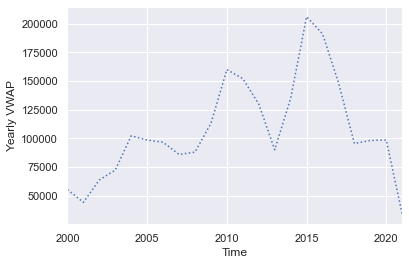

In [17]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn; seaborn.set()
stock_market.index = stock_market['Time']
yearly = stock_market['VWAP'].resample('Y').sum()
yearly.plot(style=[':'])
plt.ylabel('Yearly VWAP');

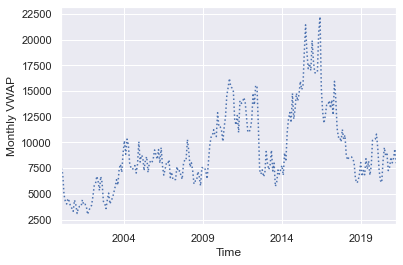

In [18]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn; seaborn.set()
stock_market.index = stock_market['Time']
monthly = stock_market['VWAP'].resample('M').sum()
monthly.plot(style=[':'])
plt.ylabel('Monthly VWAP');

<AxesSubplot:xlabel='VWAP', ylabel='Density'>

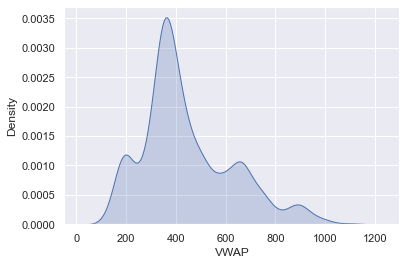

In [19]:
import seaborn as sns
sns.kdeplot(stock_market['VWAP'],shade=True) #kernel density plot shows where most of the data is located

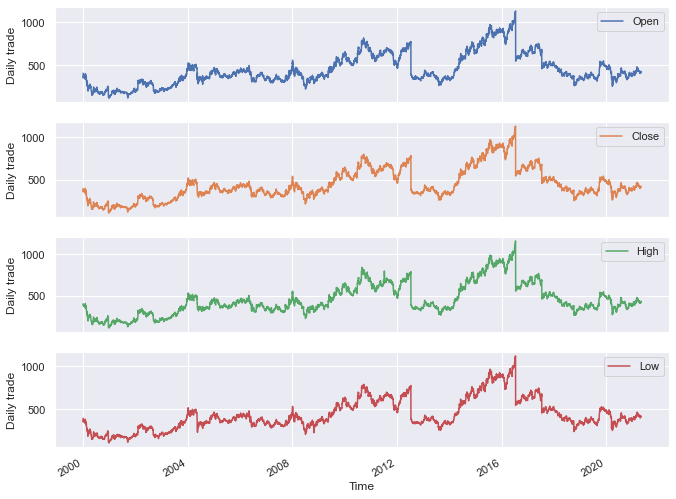

In [20]:
cols_plot = ['Open', 'Close', 'High','Low']
axes = stock_market[cols_plot].plot(figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Daily trade')

In [21]:
import plotly.graph_objects as go
fig = go.Figure([go.Scatter(x=stock_market['Time'], y=stock_market['Volume'])])
fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    title='Volume as a function of time'
)
fig.update_xaxes(title="Time")
fig.update_yaxes(title="Volume")
fig.show()

In [22]:
fig = go.Figure([go.Scatter(x=stock_market['Time'], y=stock_market['Deliverable Volume'])])
fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    title='Deliverable Volume as a function of time'
)
fig.update_xaxes(title="Time")
fig.update_yaxes(title="Deliverable Volume")
fig.show()

In [23]:
fig = go.Figure([go.Scatter(x=stock_market['Time'], y=stock_market['Turnover'])])
fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    title='Turnover as a function of time'
)
fig.update_xaxes(title="Time")
fig.update_yaxes(title="Turnover")
fig.show()

In [24]:
fig = go.Figure([go.Scatter(x=stock_market['Time'], y=stock_market['Last'])])
fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    title='Last as a function of time'
)
fig.update_xaxes(title="Time")
fig.update_yaxes(title="Last")
fig.show()

In [24]:
!conda install -c anaconda scipy.stats -y

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.

PackagesNotFoundError: The following packages are not available from current channels:

  - scipy.stats

Current channels:

  - https://conda.anaconda.org/anaconda/osx-64
  - https://conda.anaconda.org/anaconda/noarch
  - https://conda.anaconda.org/conda-forge/osx-64
  - https://conda.anaconda.org/conda-forge/noarch
  - https://repo.anaconda.com/pkgs/main/osx-64
  - https://repo.anaconda.com/pkgs/main/noarch
  - https://repo.anaconda.com/pkgs/r/osx-64
  - https://repo.anaconda.com/pkgs/r/noarch

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.




In [25]:
import sys
sys.path.append('/Users/elinorvelasquez/anaconda3/lib/python3.8/site-packages/')
!conda install -c anaconda scipy -y

Solving environment: done

# All requested packages already installed.



In [26]:
!conda install -c anaconda scipy.stats -y

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.

PackagesNotFoundError: The following packages are not available from current channels:

  - scipy.stats

Current channels:

  - https://conda.anaconda.org/anaconda/osx-64
  - https://conda.anaconda.org/anaconda/noarch
  - https://conda.anaconda.org/conda-forge/osx-64
  - https://conda.anaconda.org/conda-forge/noarch
  - https://repo.anaconda.com/pkgs/main/osx-64
  - https://repo.anaconda.com/pkgs/main/noarch
  - https://repo.anaconda.com/pkgs/r/osx-64
  - https://repo.anaconda.com/pkgs/r/noarch

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.




Using matplotlib backend: MacOSX
Populating the interactive namespace from numpy and matplotlib


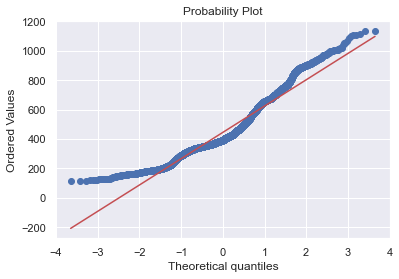

In [28]:
# Q-Q plot
%matplotlib
import scipy.stats as sc
%pylab inline
sc.probplot(stock_market.VWAP,plot=pylab)
pylab.show();

In [29]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
#!conda install -c anaconda statsmodels -y
def dicky_fuller_test(x):
    result = adfuller(x)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
    if result[1]>0.05:
        print("Fail to reject the null hypothesis (H0), the data is non-stationary")
    else:
        print("Reject the null hypothesis (H0), the data is stationary.")

dicky_fuller_test(stock_market['VWAP'])

ADF Statistic: -2.926078
p-value: 0.042398
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
Reject the null hypothesis (H0), the data is stationary.


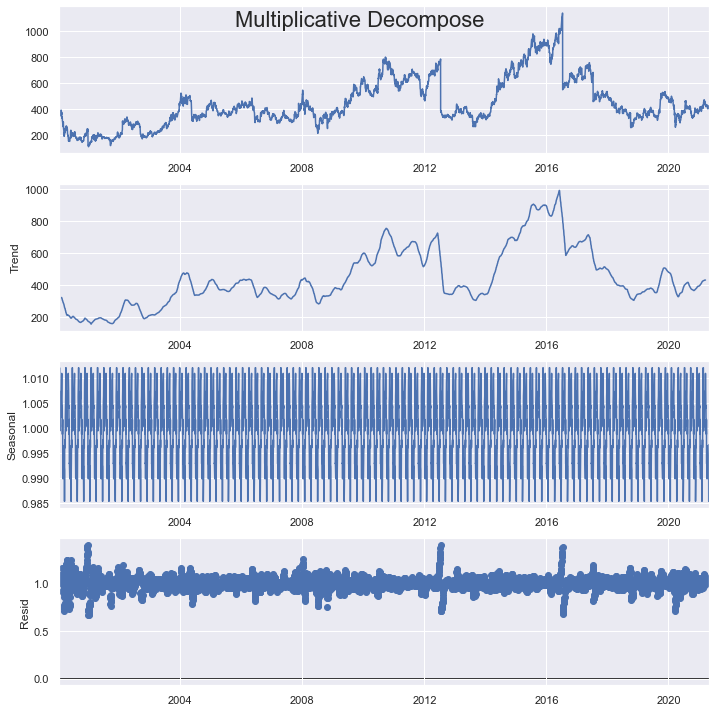

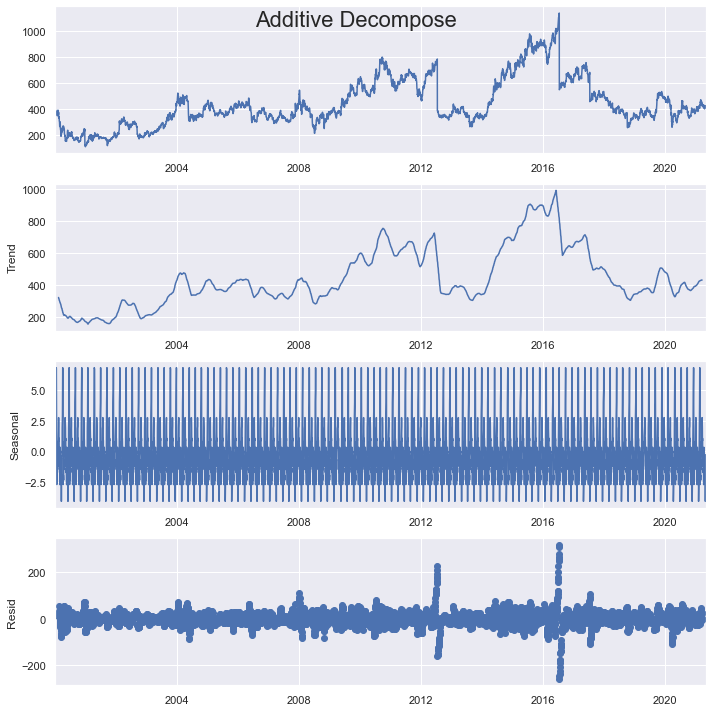

In [30]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

plt.rcParams.update({'figure.figsize': (10,10)})
y = stock_market['VWAP'].to_frame()

# Multiplicative Decomposition 
result_mul = seasonal_decompose(y, model='multiplicative', period = 52)

# Additive Decomposition
result_add = seasonal_decompose(y, model='additive', period = 52)

# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

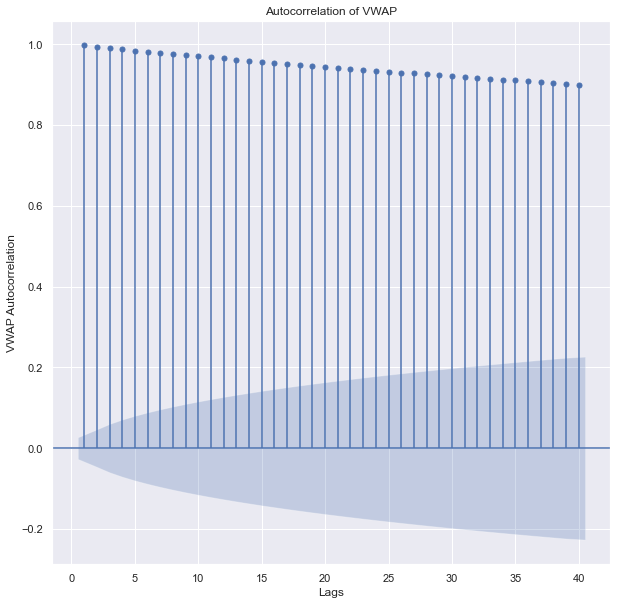

In [30]:
#from statsmodels.tsa.seasonal import seasonal_decompose
#from statsmodels import graphics
import statsmodels.api as sm
sm.graphics.tsa.plot_acf(stock_market['VWAP'].iloc[1:], lags=40,title='Autocorrelation of VWAP',zero=False)
plt.xlabel("Lags")
plt.ylabel("VWAP Autocorrelation")
plt.show()

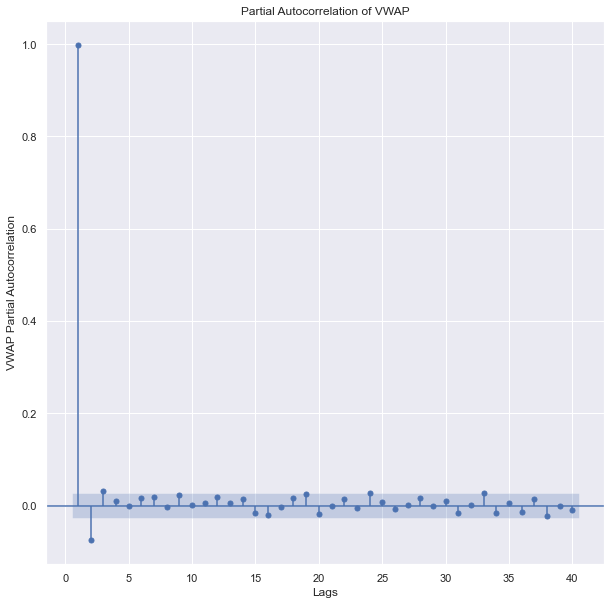

In [31]:
sm.graphics.tsa.plot_pacf(stock_market['VWAP'].iloc[1:], lags=40,title='Partial Autocorrelation of VWAP',zero=False)
plt.xlabel("Lags")
plt.ylabel("VWAP Partial Autocorrelation")
plt.show()

### Preprocessing ###

In [31]:
stock_market.to_csv('stock_market.csv')

In [ ]:
# save the data to a new csv file
#seoul_bike.to_csv('seoul_bike.csv')